Project 2 report
=

In [2]:
# !pip install folium
# !pip install shapely
# !pip install geopandas
# !pip install statsmodels
# !pip install meteostat
# !pip install opencage

In [1]:
import openaq
import seaborn as sns
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import warnings
import numpy as np
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame
from mpl_toolkits.basemap import Basemap
from meteostat import Point, Daily
import statsmodels.formula.api as smf
from datetime import datetime
import folium
from folium import plugins
from folium import Marker
from opencage.geocoder import OpenCageGeocode
%matplotlib inline

## Visualise the levels of air pollution on maps

In [2]:
# Import Data as dataframe 
api = openaq.OpenAQ()
res = api.parameters(df=True)

# Find the types of pollutants in the data
class_polluants = res['name'].unique()
print(class_polluants)

['pm10' 'pm25' 'o3' 'co' 'no2' 'so2' 'bc' 'pm1' 'co2' 'nox' 'ch4' 'ufp'
 'no' 'um010' 'um025' 'um100']


##### **Analysis**
- A total of 16 pollutants appeared in the data. 
- In the following visualized  global map of the levels of air pollution, we will focus on the main **7** kinds of pollutants just like [OpenAQ](https://openaq.org/#/map?parameter=1)

### Create a function **"drawaq()"** to visualize the global distribution of each pollutant.

In [3]:
def drawaq(p,minv,maxv,lim):
    """
    A world map showing the latest measurements of one pollutant all over the world, 
    and colour-coding the different levels to quickly visualise hot spots.

    Input:  
        p:    Name of the pollutant (e.g. 'so2').
        minv: the minimum value of the selected pollutants.
        maxv: the maximum value of the selected pollutants.
        lim:  the maximum size of the data. 
    
    Output: 
        A plot: shows the value of selected pollutants 
                in various monitoring locations that has limited number around the world, 
                and uses different colors to indicate the size of the value 
                (blue: low pollution;  red: high pollution)
    """
    
    # Extract the location of each site
    res = api.measurements(parameter=p, limit=lim, df=True)
    res = res.groupby(['location']).first()
    n = res.count()
    # Extract the longitude of each station
    x = res['coordinates.longitude']
    # Extract the latitude of each site
    y = res['coordinates.latitude']
    # the value of pollutants
    v = res['value']

    # Create a figure with a sky blue background color
    fig = plt.figure(figsize=(34, 26),facecolor='lightskyblue')
    
    # Create a world map
    map = Basemap()
    map.shadedrelief(scale=0.1)
    
    # Add latitude on the y-axis and longitude on the x-axis
    map.drawparallels(circles=np.linspace(-90, 90, 7),labels=[1, 0, 0, 0], color='gray')
    map.drawmeridians(meridians=np.linspace(-180, 180, 13),labels=[0, 0, 0, 1], color='gray')
    
    # Create a scatter plot based on the latitude and longitude of each site
    map.scatter(x, y, s=20, c=v, norm=plt.Normalize(vmin=minv, vmax=maxv), cmap=plt.cm.jet)

    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap='jet', norm=plt.Normalize(vmin=minv, vmax=maxv))
    cbar = fig.colorbar(sm, shrink=0.5)
    
    # Show plot
    plt.show()
    

### 🚩1. so2 (Sulfur Dioxide)

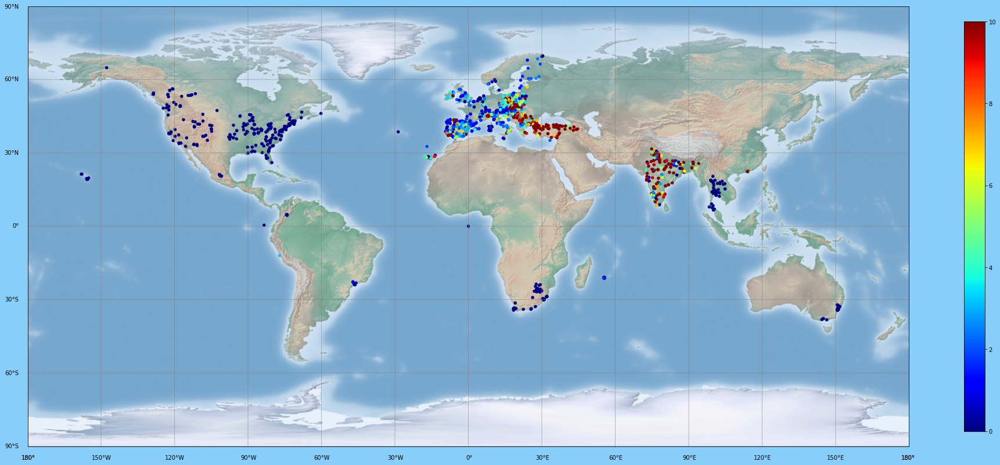

In [4]:
# The global distribution of so2, 
# the minimum value is 0 µg/m³, 
# the maximum value is 10 µg/m³, 
# and the maximum data size is 10000
drawaq('so2',0,10,10000)

1. Background:
 - SO2 is one of the most important global air pollutants. SO2 and its secondary pollutants (such as PM2.5) can cause respiratory diseases, cardiovascular diseases, premature death, etc., as well as acid rain and fog. Environmental issues such as haze. 

 - Two-thirds of the world's man-made SO2 pollution are caused by coal and oil burning in thermal power plants or industries, followed by oil refineries and smelters. ( Based on NASA's (NASA) 2005-2018 global SO2 emission hotspots (i.e. high-intensity SO2 emission sources or regions) data )


2. India: 
 - From plot，India is the world's largest emitter of SO2 pollution, and India contributes more than 15% of SO2 emissions in global man-made hot spots. 
 - Consulting the documents and materials, the serious SO2 pollution in India is due to the rapid growth of the thermal power industry in the past decade. Not only has the emissions of existing SO2 hotspots increased in the past, but also due to the commissioning of new thermal power plants, new emissions hotspots have emerged throughout the country. In order to prevent pollution, the Ministry of Environment, Forest and Climate Change of India first proposed SO2 emission standards for coal-fired power plants in December 2015, but the deadline for the installation of flue gas desulfurization devices (FGD) in power plants has been postponed from 2017 to 2022.


3. Europe:
 - In Eastern Europe, So2 emissions are more serious, especially Ukraine, Serbia, Bulgaria and Turkey, which may be related to their national policies. For example, in 2017 the European Union adopted stricter SO2 emission standards for coal-fired power plants. However, Bulgaria opposes these new regulations and still permits operating power plants to exceed emission standards. It also seeks exemptions for these power plants instead of taking measures to phase out coal power plants.
 - In addition, the SO2 pollution in Spain and Portugal is also relatively serious. But there is no so2 pollution problem in most parts of Northern Europe!


4. America:
 - It can be seen from the plot that SO2 emissions in almost all regions of the United States are very low and mainly concentrated in coastal areas.



### 🚩2. pm10 (Particulate matter less than 10 micrometers in diameter) 

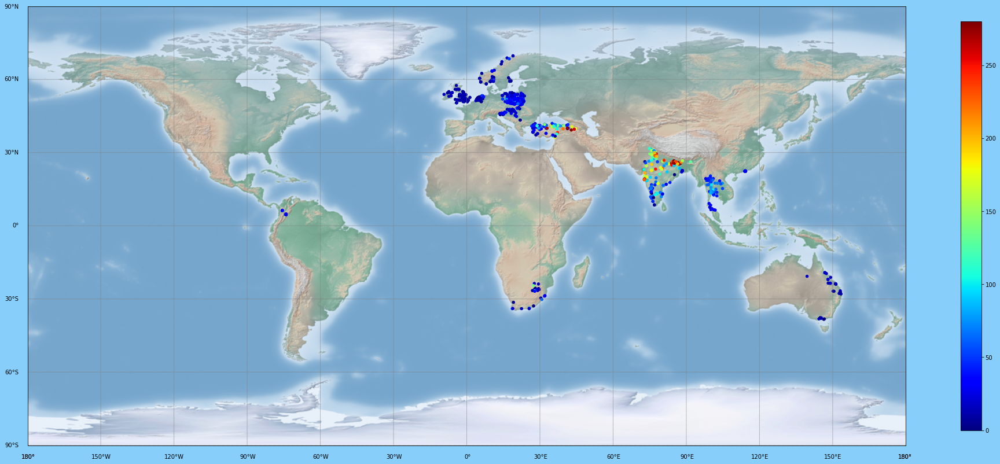

In [5]:
# The global distribution of pm10, 
# the minimum value is 0 µg/m³, 
# the maximum value is 280 µg/m³, 
# and the maximum data size is 1000
drawaq('pm10',0,280,1000)

***Analysis***

1. Background:
 - Inhalable particles last for a long time in the ambient air, and has a great impact on human health and atmospheric visibility. It usually comes from motor vehicles driving on unpaved asphalt and cement roads, the crushing and grinding process of materials, and the dust raised by the wind.


2. Distribution limited:
 - Due to some reasons of the data itself (such as data errors), we can only limit the data size to 1000.


3. India:
 - We can see that India is still the most polluted country from the pm10 data distribution map of this small data


4. Europe:
 - We found that there is slight pollution in the southern Caspian Sea, the southern Baltic Sea and the southern North Sea.
 
 
5. America:
 - It can be seen from the plot that SO2 emissions in almost all regions of the United States are very low and mainly concentrated in coastal areas.


6. Others:
 - There are also some pollution points in South Asia and Western Australia.


### 🚩3. pm25 (Particulate matter less than 10 micrometers in diameter) 

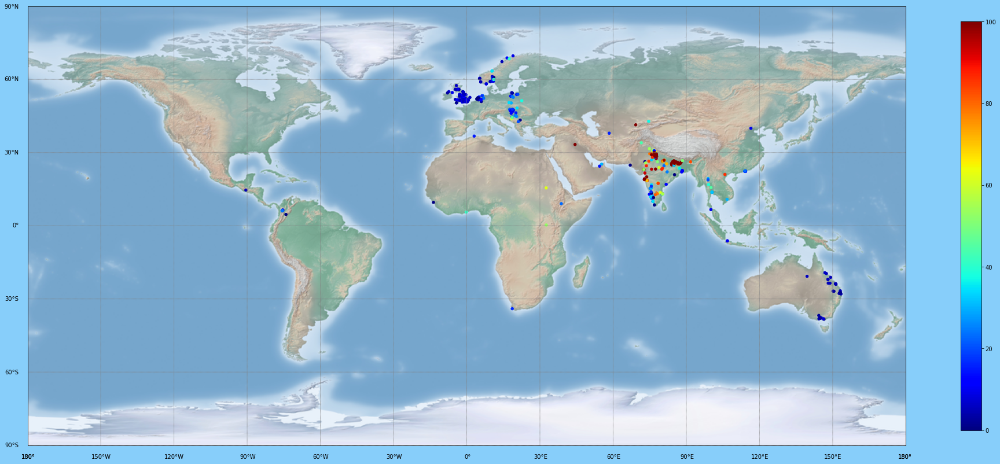

In [6]:
# The global distribution of pm2.5, 
# the minimum value is 0 µg/m³, 
# the maximum value is 100 µg/m³, 
# and the maximum data size is 500
drawaq('pm25',0,100,500)

***Analysis***

1. Background:
 - Although PM2.5 is only a small component in the earth's atmosphere, it has an important impact on air quality and visibility. PM2.5 has strong activity and is easy to carry toxic and harmful substances (for example, heavy metals, microorganisms, etc.). Moreover, the residence time in the atmosphere is long, which has a greater impact on human health and the quality of the atmospheric environment.


2. Distribution limited:
 - Due to some reasons of the data itself (such as data errors), we can only limit the data size to 500.


3. India:
 - We can see that India is still the most polluted country from the pm2.5 data distribution map of this small data.


4. Others:
 - There are also some pollution points in Central Europe, South Asia and Western Australia.

### 🚩4. no2 (Nitrogen Dioxide) 

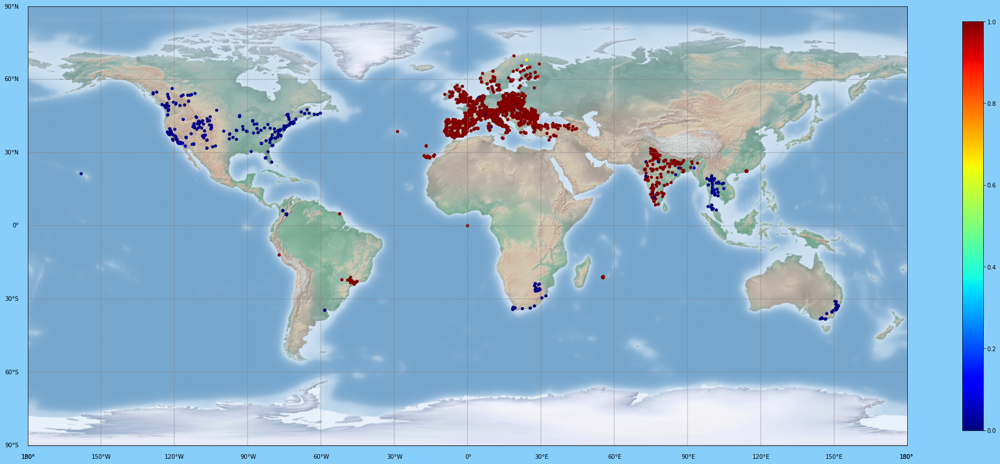

In [7]:
# The global distribution of no2, 
# the minimum value is 0 µg/m³, 
# the maximum value is 1 µg/m³, 
# and the maximum data size is 10000
drawaq('no2',0,1,10000)

***Analysis***

1. Background:
 - Nitrogen dioxide plays an important role in the formation of ozone. Man-made nitrogen dioxide mainly comes from the release of high-temperature combustion processes, such as motor vehicle exhaust and boiler exhaust. Nitrogen dioxide is also one of the causes of acid rain, and its environmental effects are diverse, including: reduced visibility of the atmosphere, acidification of surface water, and increased toxins harmful to aquatic organisms in water bodies.


2. Europe:
 - Nitrogen dioxide density is very high in most areas of Europe, expecially southern part. This may be because the region is developed and there are too many motor vehicles causing pollution.
 
 
3. India:
 - Almost all areas of India have serious nitrogen dioxide pollution problems, probably because of the dry climate and rapid industrial development.


4. America:
 - It can be seen from the plot that no2 emissions in almost all regions of the United States are very low and mainly concentrated in coastal areas.


5. Others:
 - There is also nitrogen dioxide pollution in Southeast Asia and some African regions. The reason may be that the vegetation in these areas has been burned.

### 🚩5. co (Carbon Monoxide)

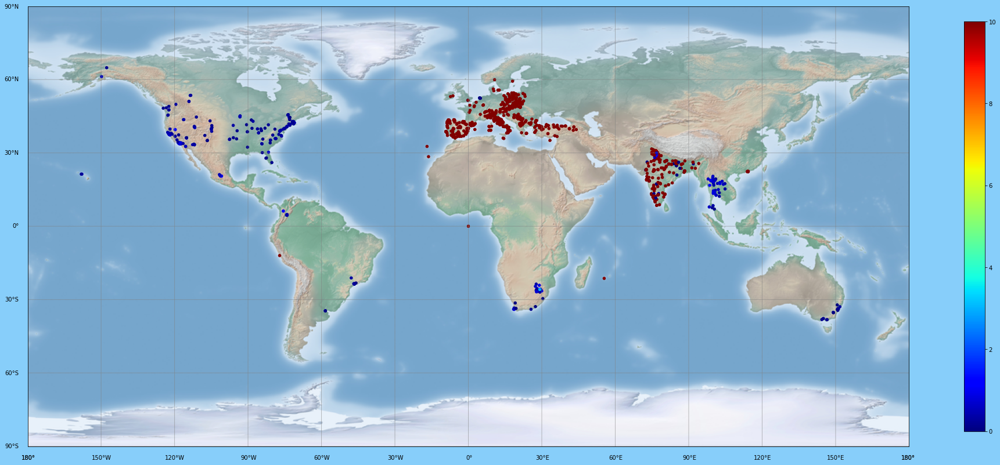

In [8]:
# The global distribution of co, 
# the minimum value is 0 µg/m³, 
# the maximum value is 10 µg/m³, 
# and the maximum data size is 10000
drawaq('co',0,10,10000)

***Analysis***

1. Background:
 - CO is the largest air pollutant and one of the important pollutants generated in the combustion process. Man-made sources of CO are mainly fossil fuel combustion, petroleum refining, solid waste incineration, etc.; natural sources are mainly forest fires, and the decay of marine and terrestrial organisms.
 

2. Distribution:
 - The distribution of co is very similar to that of no2. It may be because the fuel is not fully burned will produce co and no2 at the same time.

### 🚩6. o3 (Ozone)  

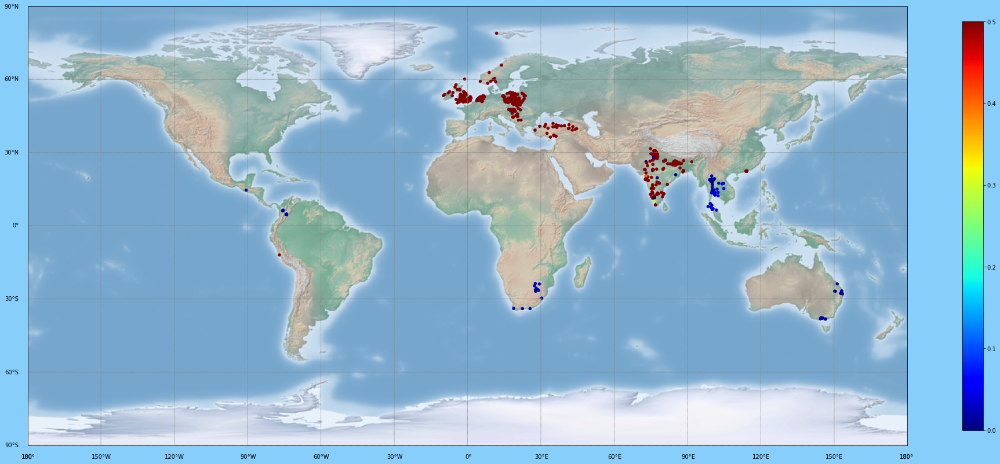

In [9]:
# The global distribution of o3, 
# the minimum value is 0 µg/m³, 
# the maximum value is 0.5 µg/m³, 
# and the maximum data size is 500
drawaq('o3',0,0.5,500)  

***Analysis***

1. Background:
 - The so-called ozone pollution is always inseparable from photochemical smog. The daily ozone pollution actually refers to photochemical smog.
 

2. Distribution limited:
 - Due to some reasons of the data itself (such as data errors), we can only limit the data size to 500.
 

3. Distribution:
 - The whole of India and Eastern Europe is heavily polluted.
 - There are also some pollution points in Southeast Asia and eastern Australia.

### 🚩7. bc (Black Carbon) 

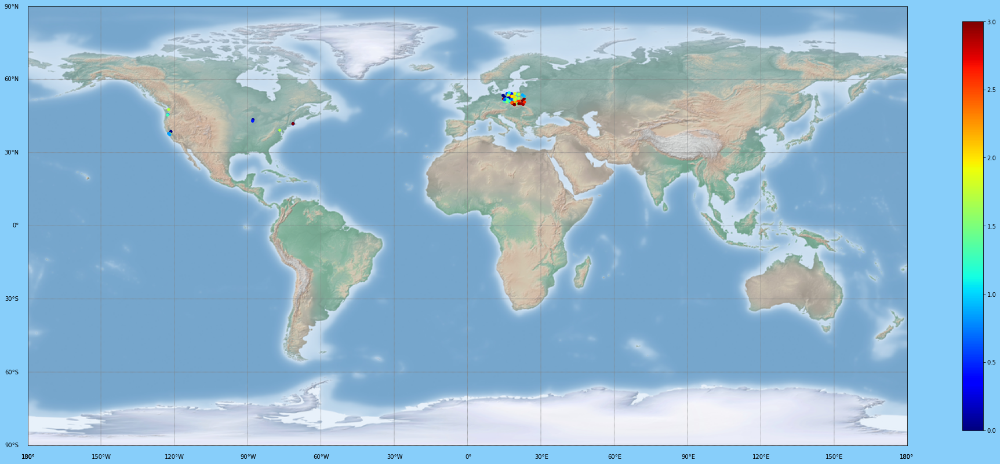

In [10]:
# The global distribution of bc, 
# the minimum value is 0 µg/m³, 
# the maximum value is 3 µg/m³, 
# and the maximum data size is 10000
drawaq('bc',0,3,10000)

***Analysis***

1. Background:
 - The environmental pollution of carbon black mainly includes: exhaust emissions, equipment leakage and soot and dust pollution in packaging; pollution of harmful gases such as steam in exhaust emissions.
 

2. Europe:
 - The polluted areas are mainly concentrated in the southern Baltic Sea in Europe, especially Poland. The main reason is probably because Poland is one of the largest exporters of carbon black.

## Background

In recent years, as economic development continues to accelerate, industrialization and urbanization continue to increase, polluting gases and respirable particulate matter emitted from factories are increasing, and air pollution is becoming more and more serious. Due to different meteorological conditions, the speed of air pollutant dispersion and the degree of pollution may also vary. Based on this situation, we have explored around the effects of various weather phenomena on air pollution.


From the world map, we observe that Eastern Europe, the east coast of the United States and the southeastern part of Australia have dense data and also have some notable features. So we selected three representative cities (Pittsburgh, Canberra and Skawina) for analysis.

## Pittsburgh

In [9]:
# Geo location mapping

data_country = api.latest(country = 'US', df=True)
data_country = data_country.dropna(subset = ['averagingPeriod.value'])
df = data_country.copy()

# get api key from:  https://opencagedata.com
key = 'ee91949bafc44bf1a93652d30700bf66'
	
geocoder = OpenCageGeocode(key)

# Creating a for loop to map the geo locations
list_lat = []   # create empty lists
list_long = []


# iterate over rows in dataframe
for index, row in df.iterrows(): 

    City = row['city']       
    query = str(City)

    # Forward geocoding
    results = geocoder.geocode(query)    
    lat = results[0]['geometry']['lat']
    long = results[0]['geometry']['lng']

    list_lat.append(lat)
    list_long.append(long)


# create new columns from lists    
df['lat'] = list_lat   
df['lon'] = list_long

# Select city
City = 'Pittsburgh'      
query = str(City)
# Forward geocoding
results = geocoder.geocode(query)    
lat = results[0]['geometry']['lat']
long = results[0]['geometry']['lng']
# print(lat,long)

In [10]:
Center = [lat, long]
m = folium.Map(Center, zoom_start=5)
folium.Marker(Center, popup='Pittsburgh',icon=folium.Icon(color='red')).add_to(m)

# mark each station as a point
for index, row in df.iterrows():
    folium.CircleMarker([row['lat'], row['lon']],
                        radius=5, popup=row['city'],
                        color="cornflowerblue", stroke=False,opacity=20,
                        fill=True, fill_color="#3388ff",fill_opacity=20,
                       ).add_to(m)
    
# convert to (n, 2) nd-array format for heatmap
stationArr = df[['lat', 'lon']].values

# plot heatmap
m.add_children(plugins.HeatMap(stationArr, radius=13))
m.add_child(folium.LatLngPopup())
m

In [12]:
geometry = [Point(xy) for xy in zip(df['lon'], df['lat'])]
gdf = GeoDataFrame(df, geometry=geometry)   

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15);

TypeError: __init__() missing 1 required positional argument: 'lon'

In [17]:
# get the pm25 data for Pittsburgh
Pittsburgh_pm25 = api.measurements(country='US', city='Pittsburgh', parameter='pm25', date_from='2021-10-04',date_to="2021-12-05",limit=10000, df=True)

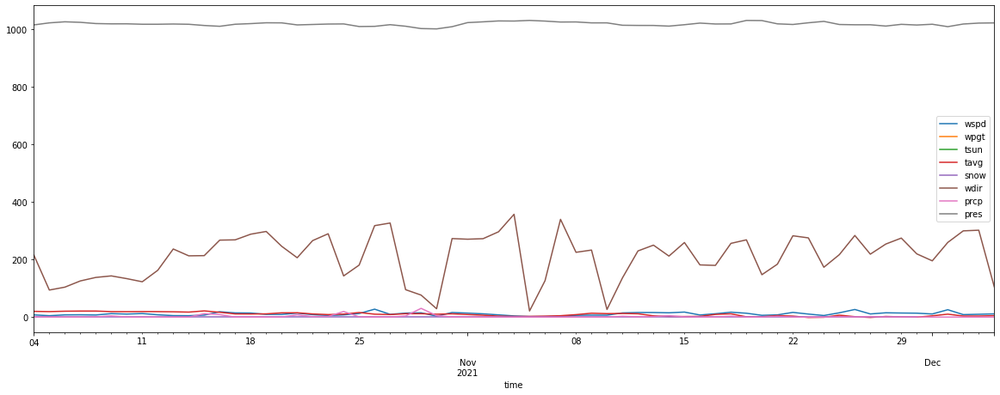

In [18]:
# Set time period
start = datetime(2021, 10, 4)
end = datetime(2021, 12, 5)

Pittsburgh_point = Point(40.44062,-79.99589) # set Pittsburgh location coordinates

# Get daily data
Pittsburgh_data = Daily(Pittsburgh_point, start, end) 
Pittsburgh_data = Pittsburgh_data.fetch()

# Plot line chart including some weather conditions of Pittsburgh
Pittsburgh_data.plot(y=['wspd',"wpgt","tsun","tavg","snow","wdir","prcp","pres"],figsize=(20,7))
plt.show()

`tavg`: The average air temperature in °C

`tmin`: The minimum air temperature in °C

`tmax`: The maximum air temperature in °C

`prcp`: The daily precipitation total in mm

`snow`: The snow depth in mm

`wdir`: The average wind direction in degrees (°)

`wspd`: The average wind speed in km/h

`wpgt`: The peak wind gust in km/h

`pres`: The average sea-level air pressure in hPa

`tsun`: The daily sunshine total in minutes (m)

In [19]:
Pittsburgh_pm25["time"] = pd.to_datetime(Pittsburgh_pm25.index).date # convert time type
Pittsburgh_pm25 = pd.DataFrame(Pittsburgh_pm25.groupby(["time"])["value"].mean()) # extract the daily average of pm25 in Pittsburgh
Pittsburgh_pm25 = Pittsburgh_pm25.reset_index() # add a column of time data

In [20]:
Pittsburgh_data = Pittsburgh_data.reset_index() # add a column of time data
Pittsburgh_data["time"] = pd.to_datetime(Pittsburgh_data["time"]) # convert time type
Pittsburgh_data = Pittsburgh_data.drop(["snow","tsun","wpgt"],axis=1) # drop weather conditions for which no data is available

In [21]:
Pittsburgh_pm25["time"] = pd.to_datetime(Pittsburgh_pm25["time"]) # convert time type
Pittsburgh_Data0 = pd.merge(Pittsburgh_pm25, Pittsburgh_data, how='left') # merge pm25 data and temperature data for Pittsburgh into new dataframe
Pittsburgh_Data0.rename(columns={'value': 'pm25'}, inplace = True) # replace the column name "value" to new column name

In [22]:
# get the so2 data for Pittsburgh
Pittsburgh_so2 = api.measurements(country='US', city='Pittsburgh', parameter='so2', date_from='2021-10-4',date_to="2021-12-5", limit=10000, df=True)
Pittsburgh_so2["time"] = pd.to_datetime(Pittsburgh_so2.index).date # convert time type
Pittsburgh_so2 = pd.DataFrame(Pittsburgh_so2.groupby(["time"])["value"].mean()) # extract the daily average of so2 in Pittsburgh
Pittsburgh_so2 = Pittsburgh_so2.reset_index() # add a column of time data
Pittsburgh_so2 = Pittsburgh_so2.drop([0]) # make the new data length consistent with the weather data
Pittsburgh_so2["time"] = pd.to_datetime(Pittsburgh_so2["time"]) # convert time type

In [23]:
Pittsburgh_Data1 = pd.merge(Pittsburgh_so2, Pittsburgh_Data0, how='left') # merge so2 data and old data of Pittsburgh into new dataframe
Pittsburgh_Data1.rename(columns={'value': 'so2'}, inplace = True) # replace the column name "value" to new column name

In [24]:
# get the o3 data for Pittsburgh
Pittsburgh_o3 = api.measurements(country='US', city='Pittsburgh', parameter='o3', date_from='2021-10-4',date_to="2021-12-5", limit=10000, df=True)
Pittsburgh_o3["time"] = pd.to_datetime(Pittsburgh_o3.index).date # convert time type
Pittsburgh_o3 = pd.DataFrame(Pittsburgh_o3.groupby(["time"])["value"].mean()) # extract the daily average of o3 in Pittsburgh
Pittsburgh_o3 = Pittsburgh_o3.reset_index() # add a column of time data
Pittsburgh_o3["time"] = pd.to_datetime(Pittsburgh_o3["time"]) # convert time type
Pittsburgh_Data2 = pd.merge(Pittsburgh_o3, Pittsburgh_Data1, how='left') # merge o3 data and old data of Pittsburgh into new dataframe

In [25]:
Pittsburgh_Data2.rename(columns={'value': 'o3'}, inplace = True) # replace the column name "value" to new column name

In [26]:
Pittsburgh_Data2.head() # check the final dataframe

,time,o3,so2,pm25,tavg,tmin,tmax,prcp,wdir,wspd,pres
0,2021-10-23,0.011151,0.000148,6.763095,8.6,6.7,10.6,2.3,289.2,5.4,1017.3
1,2021-10-24,0.015386,0.000171,8.121429,10.3,7.8,15.0,19.3,142.8,7.6,1017.7
2,2021-10-25,0.025078,0.000000,7.062346,15.8,11.7,20.0,0.8,180.4,12.2,1008.7
3,2021-10-26,0.018500,0.000003,2.616667,10.0,6.7,13.3,0.3,317.4,27.4,1009.3
4,2021-10-27,0.011551,0.000659,4.531138,8.7,6.7,11.7,0.0,326.5,9.4,1015.1


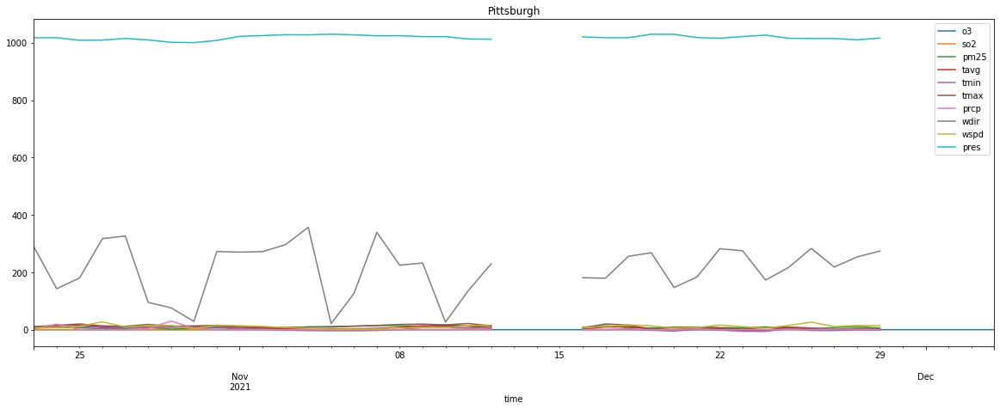

In [27]:
# plot the weather data and pollutant data of Pittsburgh
Pittsburgh_Data2 = Pittsburgh_Data2.set_index("time")
Pittsburgh_Data2.plot(y=list(Pittsburgh_Data2.columns),figsize=(20,7),title="Pittsburgh")

### Correlation analysis

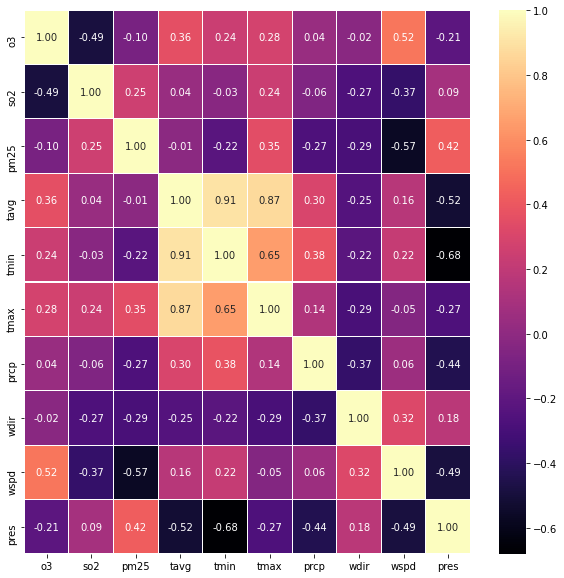

In [28]:
# Correlation analysis of weather and pollutants in Pittsburgh
fig,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Pittsburgh_Data2.corr(), ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="magma")
plt.show()

The correlation heat map visually shows the correlationship between any two variables.

From the map, it can be seen that pm25 is relatively related to tmax, prcp, wdir, wspd, pres.

The value of correlation between so2 and tmax, wdir, wspd is relatively high.

The correlation between o3 and tavg, wspd, pres is relatively high.


### Regression

Using the result from correlation analysis, linear regression models can be fitted to measure the quantitative relationship between explanatory variables and response variables.

Therefore, we fitted several linear regression models with different pollutants as response variables, trying to quantify the impact of these weather factors on each pollutant.

In [29]:
# fit regression model for pm25 using statsmodels 
formula = 'pm25~ tmax + prcp + wdir + wspd + pres' # select some highly-correlated variables to fit a regression model
model = smf.ols(formula, Pittsburgh_Data2).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   pm25   R-squared:                       0.575
Model:                            OLS   Adj. R-squared:                  0.502
Method:                 Least Squares   F-statistic:                     7.853
Date:                Mon, 06 Dec 2021   Prob (F-statistic):           8.94e-05
Time:                        20:20:17   Log-Likelihood:                -79.088
No. Observations:                  35   AIC:                             170.2
Df Residuals:                      29   BIC:                             179.5
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -129.9622     80.979     -1.605      0.1


`R-squared`：is equal to SSR/SST，where SSR is Sum of Squares for Regression and SST is Sum of Squares for Total. The value of R square is between [0, 1]. The closer its value is to 1, the better the regression model fit. 

In this model, the value of R square is 0.575，which means the model does not fit the data very poorly. 


`F-statistic`：The F-statistic provides us with a way for globally testing if ANY of the independent explanatory variables is related to the response variable.


If the p-value associated with the F-statistic is greater than some threshold (e.g. α = .05) then there is no relationship between ANY of the explanatory variables and the response variable.
If the p-value associated with the F-statistic less than some threshold (e.g. α = .05) then, AT LEAST one explanatory variables is related to the response variable.

In this model, the p-value associated with the F-statistic is 8.94e-05, which is very small. 


`T-test`：Whenever we perform linear regression, we want to know if there is a statistically significant relationship between the predictor variable and the response variable.

We test for significance by performing a t-test for the regression slope. We use the following null and alternative hypothesis for this t-test:

H0: β1 = 0 (the slope is equal to zero)
HA: β1 ≠ 0 (the slope is not equal to zero)If the p-value that corresponds to t is less than some threshold (e.g. α = .05) then we reject the null hypothesis and conclude that there is a statistically significant relationship between the predictor variable and the response variable.

In this model, the p-values corresponds to t for all the predictor variables are not very large, from 0.007 to 0.149, which indicates that these predictor variables that we chose are highly significant.

`Fitted modle`：
pm25=-129.96+0.2524*tmax-0.1589*prcp-0.0088*wdir-0.1912*wspd-0.137pres                                              

In [30]:
# fit regression model for so2 using statsmodels
formula = 'so2~ tmax + wdir + wspd' # select some highly-correlated variables to fit a regression model
model = smf.ols(formula, Pittsburgh_Data2).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    so2   R-squared:                       0.195
Model:                            OLS   Adj. R-squared:                  0.118
Method:                 Least Squares   F-statistic:                     2.509
Date:                Mon, 06 Dec 2021   Prob (F-statistic):             0.0770
Time:                        20:20:19   Log-Likelihood:                 237.44
No. Observations:                  35   AIC:                            -466.9
Df Residuals:                      31   BIC:                            -460.7
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0003      0.000      1.736      0.0

`Fitted modle`：
so2=0.0003+1.076e-05*tmax-3.871e-07*wdir-1.653e-05wspd.

`R-squared`：In this model, the value of R square (0.195) is not quite close to 1，which means the model fits the data not very well. 


`F-statistic`：In this model, the p-value associated with the F-statistic is 0.0770, which indicates our selected variables may not have a linear relationship with response variable. 


`T-test`：The p-values corresponds to t for all the predictor variables are very large, which indicates that these predictor variables that we chose are not significant.

In [31]:
# fit regression model for o3 using statsmodels
formula = 'o3 ~ tavg + wspd + pres' # select some highly-correlated variables to fit a regression model
model = smf.ols(formula, Pittsburgh_Data2).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                     o3   R-squared:                       0.397
Model:                            OLS   Adj. R-squared:                  0.339
Method:                 Least Squares   F-statistic:                     6.814
Date:                Mon, 06 Dec 2021   Prob (F-statistic):            0.00117
Time:                        20:20:22   Log-Likelihood:                 151.86
No. Observations:                  35   AIC:                            -295.7
Df Residuals:                      31   BIC:                            -289.5
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.1512      0.102     -1.477      0.1

`Fitted modle`：
o3=-0.1512+0.0004*tavg+0.0004*wspd+0.0002pres  

`R-squared`：In this model, the value of R square (0.397) is not very close to 1，which means the model does not fit the data quite well. 


`F-statistic`：In this model, the p-value associated with the F-statistic (0.00117) is very small, which indicates our selected variables have a linear relationship with response variable. 


`T-test`：The p-values corresponds to t for some predictor variables(Intercept, pres) are very large, which indicates that these predictor variables are not significant and we may drop them in our future model.

## Canberra

In [13]:
# Geo location mapping

data_country = api.latest(country = 'AU', df=True)
data_country = data_country.dropna(subset = ['averagingPeriod.value'])
df = data_country.copy()

# get api key from:  https://opencagedata.com
key = 'ee91949bafc44bf1a93652d30700bf66'
	
geocoder = OpenCageGeocode(key)

# Creating a for loop to map the geo locations
list_lat = []   # create empty lists
list_long = []


# iterate over rows in dataframe
for index, row in df.iterrows(): 

    City = row['city']       
    query = str(City)

    # Forward geocoding
    results = geocoder.geocode(query)    
    lat = results[0]['geometry']['lat']
    long = results[0]['geometry']['lng']

    list_lat.append(lat)
    list_long.append(long)


# create new columns from lists    
df['lat'] = list_lat   
df['lon'] = list_long

# Select city
City = 'Canberra'      
query = str(City)

# Forward geocoding
results = geocoder.geocode(query)    
lat = results[0]['geometry']['lat']
long = results[0]['geometry']['lng']
# print(lat,long)

In [16]:
Center = [lat, long]
m = folium.Map(Center, zoom_start=6)
folium.Marker(Center, popup='Canberra',icon=folium.Icon(color='red')).add_to(m)

# mark each station as a point
for index, row in df.iterrows():
    folium.CircleMarker([row['lat'], row['lon']],
                        radius=5, popup=row['city'],
                        color="cornflowerblue", stroke=False,opacity=20,
                        fill=True, fill_color="#3388ff",fill_opacity=20,
                       ).add_to(m)
    
# convert to (n, 2) nd-array format for heatmap
stationArr = df[['lat', 'lon']].values

# plot heatmap
m.add_children(plugins.HeatMap(stationArr, radius=13))
m.add_child(folium.LatLngPopup())
m

In [32]:
# get the pm10 data for Canberra
Canberra_pm10 = api.measurements(city='Canberra', parameter='pm10', date_from='2020-5-13',date_to="2021-12-6",limit=10000, df=True)

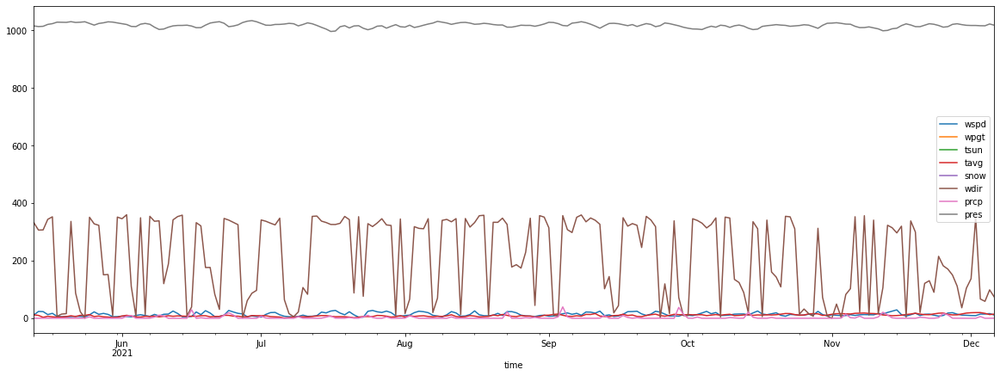

In [33]:
# Set time period
start = datetime(2021, 5, 13)
end = datetime(2021, 12, 6)

Canberra_point = Point(-35.28346, 149.12807) # set Canberra location coordinates

# Get daily data
Canberra_data = Daily(Canberra_point, start, end) 
Canberra_data = Canberra_data.fetch()

# Plot line chart including some weather conditions of Canberra
Canberra_data.plot(y=['wspd',"wpgt","tsun","tavg","snow","wdir","prcp","pres"],figsize=(20,7))
plt.show()

In [34]:
Canberra_data.info() # check the weather conditions data of Canberra

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 208 entries, 2021-05-13 to 2021-12-06
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tavg    208 non-null    float64
 1   tmin    208 non-null    float64
 2   tmax    208 non-null    float64
 3   prcp    208 non-null    float64
 4   snow    0 non-null      float64
 5   wdir    208 non-null    float64
 6   wspd    208 non-null    float64
 7   wpgt    0 non-null      float64
 8   pres    208 non-null    float64
 9   tsun    0 non-null      float64
dtypes: float64(10)
memory usage: 17.9 KB


In [35]:
Canberra_pm10["time"] = pd.to_datetime(Canberra_pm10.index).date # convert time type
Canberra_pm10 = pd.DataFrame(Canberra_pm10.groupby(["time"])["value"].mean()) # extract the daily average of pm10 in Canberra
Canberra_pm10 = Canberra_pm10.reset_index() # add a column of time data
Canberra_data = Canberra_data.reset_index() # add a column of time data
Canberra_data["time"] = pd.to_datetime(Canberra_data["time"]) # convert time type
Canberra_data = Canberra_data.drop(["snow","tsun","wpgt"],axis=1) # drop weather conditions for which no data is available
Canberra_pm10["time"] = pd.to_datetime(Canberra_pm10["time"]) # convert time type
Canberra_Data0 = pd.merge(Canberra_pm10, Canberra_data, how='left') # merge pm10 data and temperature data for Canberra into new dataframe
Canberra_Data0.rename(columns={'value': 'pm10'}, inplace = True) # replace the column name "value" to new column name

In [36]:
# get the pm25 data for Canberra
Canberra_pm25 = api.measurements(city='Canberra', parameter='pm25', date_from='2020-5-13',date_to="2021-12-6", limit=10000, df=True)
Canberra_pm25["time"] = pd.to_datetime(Canberra_pm25.index).date # convert time type
Canberra_pm25 = pd.DataFrame(Canberra_pm25.groupby(["time"])["value"].mean()) # extract the daily average of pm25 in Canberra
Canberra_pm25 = Canberra_pm25.reset_index() # add a column of time data
Canberra_pm25 = Canberra_pm25.drop([0]) # make the new data length consistent with the weather data
Canberra_pm25["time"] = pd.to_datetime(Canberra_pm25["time"]) # convert time type
Canberra_Data1 = pd.merge(Canberra_pm25, Canberra_Data0, how='left') # merge pm25 data and old data for Canberra into new dataframe
Canberra_Data1.rename(columns={'value': 'pm25'}, inplace = True) # replace the column name "value" to new column name



In [37]:
# get the co data for Canberra
Canberra_co = api.measurements(city='Canberra', parameter='co', date_from='2020-5-13',date_to="2021-12-6", limit=10000, df=True)
Canberra_co["time"] = pd.to_datetime(Canberra_co.index).date # convert time type
Canberra_co = pd.DataFrame(Canberra_co.groupby(["time"])["value"].mean()) # extract the daily average of co in Canberra
Canberra_co = Canberra_co.reset_index() # add a column of time data
Canberra_co = Canberra_co.drop([n for n in range(0,13)]) # make the new data length consistent with the weather data
Canberra_co["time"] = pd.to_datetime(Canberra_co["time"]) # convert time type
Canberra_Data2 = pd.merge(Canberra_co, Canberra_Data1, how='left') # merge co data and old data for Canberra into new dataframe
Canberra_Data2.rename(columns={'value': 'co'}, inplace = True) # replace the column name "value" to new column name


In [38]:
# get the no2 data for Canberra
Canberra_no2 = api.measurements(city='Canberra', parameter='no2', date_from='2020-5-13', date_to="2021-12-6", limit=10000, df=True)
Canberra_no2["time"] = pd.to_datetime(Canberra_no2.index).date # convert time type
Canberra_no2 = pd.DataFrame(Canberra_no2.groupby(["time"])["value"].mean()) # extract the daily average of no2 in Canberra
Canberra_no2 = Canberra_no2.reset_index() # add a column of time data
Canberra_no2 = Canberra_no2.drop([n for n in range(0,121)]) # make the new data length consistent with the weather data
Canberra_no2["time"] = pd.to_datetime(Canberra_no2["time"]) # convert time type
Canberra_Data3 = pd.merge(Canberra_no2, Canberra_Data2, how='left') # merge no2 data and old data for Canberra into new dataframe
Canberra_Data3.rename(columns={'value': 'no2'}, inplace = True) # replace the column name "value" to new column name
Canberra_Data3 # check the final dataframe


,time,no2,co,pm25,pm10,tavg,tmin,tmax,prcp,wdir,wspd,pres
0,2021-05-13,0.002587,0.294348,6.618056,11.711667,11.9,1.0,17.6,0.0,331.7,11.5,1014.7
1,2021-05-14,0.000977,0.100758,3.192222,5.920417,9.9,6.9,12.9,0.0,306.1,23.7,1012.5
2,2021-05-15,0.002652,0.113043,3.280139,5.920139,3.3,-0.9,12.1,0.0,306.7,23.1,1013.4
3,2021-05-16,0.004568,0.323636,10.582609,12.174493,6.9,-5.4,12.9,0.0,343.4,12.8,1020.0
4,2021-05-17,0.003622,0.125441,6.362083,6.733889,5.1,1.8,14.3,0.0,352.2,17.1,1022.6
...,...,...,...,...,...,...,...,...,...,...,...,...
193,2021-12-02,0.003311,0.178971,3.765417,7.960417,19.7,11.0,28.0,0.0,350.1,9.2,1016.3
194,2021-12-03,0.002500,0.224058,6.133472,9.761944,19.8,13.0,29.0,6.0,66.8,14.5,1015.4
195,2021-12-04,0.000174,0.201739,3.647222,9.200972,17.0,13.0,25.0,0.0,58.8,14.6,1015.2
196,2021-12-05,0.000000,0.112029,3.069444,5.908472,12.9,10.0,16.0,0.0,98.6,16.3,1021.5


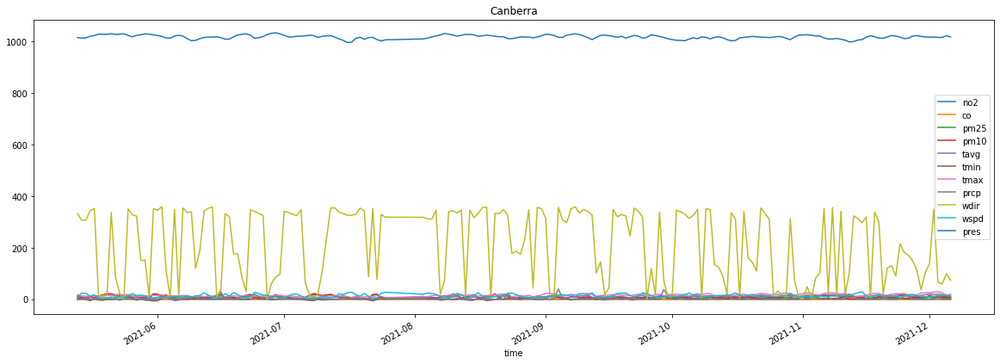

In [39]:
# plot the weather data and pollutant data for Canberra
Canberra_Data3 = Canberra_Data3.set_index("time")
Canberra_Data3.plot(y=list(Canberra_Data3.columns),figsize=(20,7),title="Canberra")

We can directly observe from the graph whether the weather factors and selected pollutants have the same trend.

### Correlation analysis

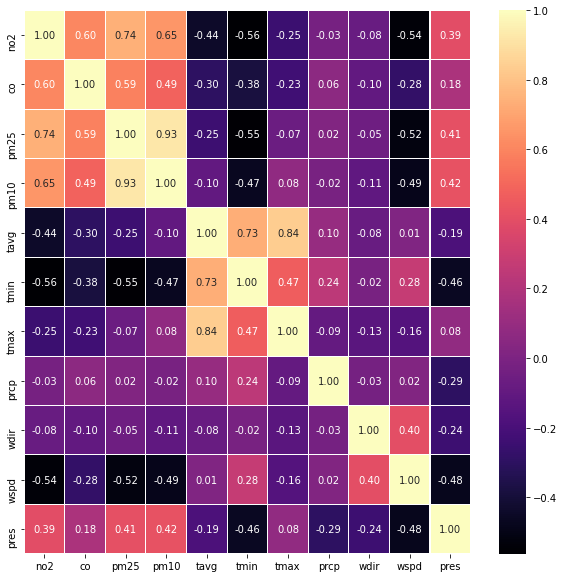

In [40]:
# Correlation analysis of weather and pollutants in Canberra
fig,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Canberra_Data3.corr(), ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="magma")
plt.show()

The correlation heat map visually shows the correlationship between any two variables.

From the map, it can be seen that pm25 is relatively related to tmin, prcp, wspd, pres.

The value of correlation between pm10 and tmin, wspd is relatively high.

The correlation between no2 and tmin, wspd, pres is relatively high.

### Regression

Using the result from correlation analysis, linear regression models can be fitted to measure the quantitative relationship between explanatory variables and response variables.

Therefore, we fitted several linear regression models with different pollutants as response variables, trying to quantify the impact of these weather factors on each pollutant.

In [41]:
formula = 'pm25 ~ tmin + wspd + pres' # select some highly-correlated variables to fit a regression model
model = smf.ols(formula, Canberra_Data3).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   pm25   R-squared:                       0.448
Model:                            OLS   Adj. R-squared:                  0.439
Method:                 Least Squares   F-statistic:                     52.42
Date:                Mon, 06 Dec 2021   Prob (F-statistic):           7.34e-25
Time:                        20:21:18   Log-Likelihood:                -507.90
No. Observations:                 198   AIC:                             1024.
Df Residuals:                     194   BIC:                             1037.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -6.9407     39.062     -0.178      0.8


`R-squared`：

In this model, the value of R square is 0.448，which means the model does not fit the data very poorly. 


`F-statistic`：

In this model, the p-value associated with the F-statistic is 7.03e-25, which is very small. 


`T-test`：

In this model, The p-values corresponds to t for some predictor variables(Intercept, pres) are very large, which indicates that these predictor variables are not significant and we may drop them in our future model.

`Fitted modle`：
pm25= -7.2525-0.3801*tmin-0.2642*wspd+0.0180*pres                 

In [42]:
formula = 'pm10 ~ tmin + wspd + pres' # select some highly-correlated variables to fit a regression model
model = smf.ols(formula, Canberra_Data3).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   pm10   R-squared:                       0.364
Model:                            OLS   Adj. R-squared:                  0.354
Method:                 Least Squares   F-statistic:                     37.00
Date:                Mon, 06 Dec 2021   Prob (F-statistic):           5.93e-19
Time:                        20:21:20   Log-Likelihood:                -554.18
No. Observations:                 198   AIC:                             1116.
Df Residuals:                     194   BIC:                             1130.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -56.6102     49.348     -1.147      0.2

`Fitted modle`：
pm10= -57.0946-0.3333 *tmin-0.2854*wspd+0.0697*pres    

`R-squared`：In this model, the value of R square (0.364) is not quite close to 1，which means the model fits the data not very well. 


`F-statistic`：In this model, the p-value associated with the F-statistic is 5.85e-19, which indicates our selected variables may not have a linear relationship with response variable. 


`T-test`：The p-values corresponds to t for all the predictor variables are very small, which indicates that these predictor variables that we chose are significant.



In [43]:
formula = 'co ~ tmin + wspd + pres' # select some highly-correlated variables to fit a regression model
model = smf.ols(formula, Canberra_Data3).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                     co   R-squared:                       0.184
Model:                            OLS   Adj. R-squared:                  0.172
Method:                 Least Squares   F-statistic:                     14.60
Date:                Mon, 06 Dec 2021   Prob (F-statistic):           1.30e-08
Time:                        20:21:22   Log-Likelihood:                 65.696
No. Observations:                 198   AIC:                            -123.4
Df Residuals:                     194   BIC:                            -110.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.9410      2.156      1.364      0.1

`Fitted modle`：
co= 2.9380 -0.0145 *tmin-0.0071*wspd-0.0025 *pres   

`R-squared`：In this model, the value of R square (0.184) is not quite close to 1，which means the model fits the data not very well. 


`F-statistic`：In this model, the p-value associated with the F-statistic is 1.29e-08, which indicates our selected variables may not have a linear relationship with response variable. 


`T-test`：The p-values corresponds to t for all the predictor variables are very small, which indicates that these predictor variables that we chose are significant.

In [44]:
formula = 'no2 ~ tmin + wspd + pres' # select some highly-correlated variables to fit a regression model
model = smf.ols(formula, Canberra_Data3).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    no2   R-squared:                       0.478
Model:                            OLS   Adj. R-squared:                  0.470
Method:                 Least Squares   F-statistic:                     59.30
Date:                Mon, 06 Dec 2021   Prob (F-statistic):           2.98e-27
Time:                        20:21:24   Log-Likelihood:                 956.40
No. Observations:                 198   AIC:                            -1905.
Df Residuals:                     194   BIC:                            -1892.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0140      0.024      0.583      0.5

`Fitted modle`：
no2= 0.0136-0.0003 *tmin-0.0002*wspd-6.793e-06*pres   

`R-squared`：In this model, the value of R square is 0.479 ，which means the model does not fit the data very poorly.


`F-statistic`：In this model, the p-value associated with the F-statistic is 2.61e-27, which indicates our selected variables may not have a linear relationship with response variable. 


`T-test`：In this model, The p-values corresponds to t for some predictor variables(Intercept, pres) are very large, which indicates that these predictor variables are not significant and we may drop them in our future model.

## Skawina

In [7]:
data_country = api.latest(country = 'PL', df=True)
data_country = data_country.dropna(subset = ['averagingPeriod.value'])
df = data_country.copy()

# get api key from:  https://opencagedata.com
key = 'ee91949bafc44bf1a93652d30700bf66'
	
geocoder = OpenCageGeocode(key)

# Creating a for loop to map the geo locations
list_lat = []   # create empty lists
list_long = []


# iterate over rows in dataframe
for index, row in df.iterrows(): 

    City = row['city']       
    query = str(City)

    # Forward geocoding
    results = geocoder.geocode(query)    
    lat = results[0]['geometry']['lat']
    long = results[0]['geometry']['lng']

    list_lat.append(lat)
    list_long.append(long)


# create new columns from lists    
df['lat'] = list_lat   
df['lon'] = list_long

# Select city
City = 'Skawina'      
query = str(City)

# Forward geocoding
results = geocoder.geocode(query)    
lat = results[0]['geometry']['lat']
long = results[0]['geometry']['lng']

In [5]:
Center = [lat, long]
m = folium.Map(Center, zoom_start=5)
folium.Marker(Center, popup='Skawina',icon=folium.Icon(color='red')).add_to(m)

# mark each station as a point
for index, row in df.iterrows():
    folium.CircleMarker([row['lat'], row['lon']],
                        radius=5, popup=row['city'],
                        color="cornflowerblue", stroke=False,opacity=20,
                        fill=True, fill_color="#3388ff",fill_opacity=20,
                       ).add_to(m)
    
# convert to (n, 2) nd-array format for heatmap
stationArr = df[['lat', 'lon']].values

# plot heatmap
m.add_children(plugins.HeatMap(stationArr, radius=13))
m.add_child(folium.LatLngPopup())
m

From the world map about the parameter of bc, we can know that there is a great number of data about Poland. So we decide to choose one city in Poland to investigate. Finally, we decide to choose Skawina.

In [45]:
# get the pm10, bc, so2 and no2 data for Skawina
Skawina_pm10 = api.measurements(city='Skawina', parameter='pm10', date_from='2020-12-30',date_to="2021-8-30",limit=10000, df=True)
Skawina_bc = api.measurements(city='Skawina', parameter='bc',date_from='2020-12-30',date_to="2021-8-30", limit=10000, df=True)
Skawina_so2 = api.measurements(city='Skawina', parameter='so2',date_from='2020-12-30',date_to="2021-8-30", limit=10000, df=True)
Skawina_no2 = api.measurements(city='Skawina', parameter='no2',date_from='2020-12-30',date_to="2021-8-30", limit=10000, df=True)

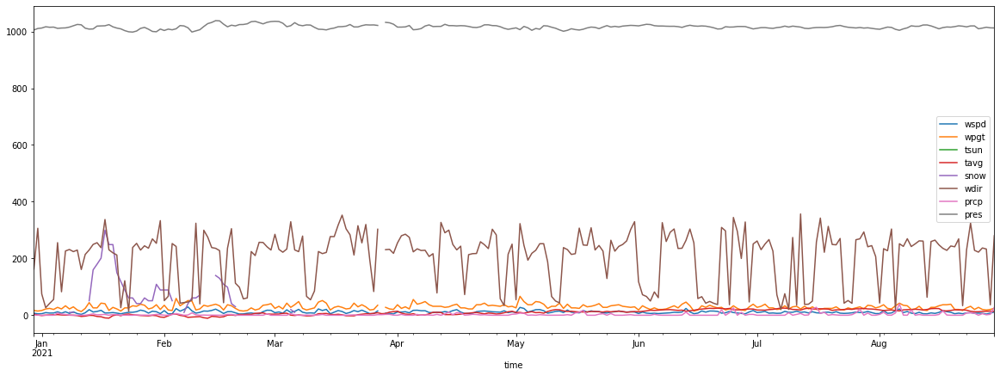

In [46]:
# Set time period
start = datetime(2020, 12, 30)
end = datetime(2021, 8, 30)
# The location
Skawina_point = Point(49.971047	, 19.830422)
# Get daily data
Skawina_data = Daily(Skawina_point, start, end)
Skawina_data = Skawina_data.fetch()
# Plot line chart 
Skawina_data.plot(y=['wspd',"wpgt","tsun","tavg","snow","wdir","prcp","pres"],figsize=(20,7))
plt.show()

In [47]:
# decide which type of condition should be dropped
Skawina_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 244 entries, 2020-12-30 to 2021-08-30
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tavg    244 non-null    float64
 1   tmin    243 non-null    float64
 2   tmax    244 non-null    float64
 3   prcp    244 non-null    float64
 4   snow    43 non-null     float64
 5   wdir    243 non-null    float64
 6   wspd    243 non-null    float64
 7   wpgt    243 non-null    float64
 8   pres    243 non-null    float64
 9   tsun    0 non-null      float64
dtypes: float64(10)
memory usage: 21.0 KB


In [48]:
# the process of dealing with the data about pm10

# convert time type
Skawina_pm10["time"] = pd.to_datetime(Skawina_pm10.index).date
# extract the daily average of pm10 in Pittsburgh
Skawina_pm10 = pd.DataFrame(Skawina_pm10.groupby(["time"])["value"].mean())
# add a column of time data
Skawina_pm10 = Skawina_pm10.reset_index()
# add a column of time data
Skawina_data =  Skawina_data.reset_index()
# convert time type
Skawina_data["time"] = pd.to_datetime(Skawina_data["time"] )
# drop weather conditions for which no data is available in Skawina
Skawina_data = Skawina_data.drop(["snow","tsun"],axis=1)
# convert time type
Skawina_pm10["time"] = pd.to_datetime(Skawina_pm10["time"])
# merge pm10 data and temperature data for Pittsburgh into new dataframe
Skawina_Data0 = pd.merge(Skawina_pm10, Skawina_data, how='left')
 # replace the column name "value" to new column name
Skawina_Data0.rename(columns={'value': 'pm10'}, inplace = True)

In [49]:
# the process of dealing with the data about no2

# convert time type
Skawina_no2["time"] = pd.to_datetime(Skawina_no2.index).date
# extract the daily average of no2 in Skawina
Skawina_no2 = pd.DataFrame(Skawina_no2.groupby(["time"])["value"].mean())
# add a column of time data
Skawina_no2 = Skawina_no2.reset_index()
# convert time type
Skawina_no2["time"] = pd.to_datetime(Skawina_no2["time"])
# merge no2 data and old data of Skawina into new dataframe
Skawina_Data1 = pd.merge(Skawina_no2, Skawina_Data0, how='left')
# replace the column name "value" to new column name
Skawina_Data1.rename(columns={'value': 'no2'}, inplace = True)

In [50]:
# the process of dealing with the data about so2

# convert time type
Skawina_so2["time"] = pd.to_datetime(Skawina_so2.index).date
# extract the daily average of so2 in Skawina
Skawina_so2 = pd.DataFrame(Skawina_so2.groupby(["time"])["value"].mean())
# add a column of time data
Skawina_so2 = Skawina_so2.reset_index()
# convert time type
Skawina_so2["time"] = pd.to_datetime(Skawina_so2["time"])
# merge so2 data and old data of Skawina into new dataframe
Skawina_Data2 = pd.merge(Skawina_so2, Skawina_Data1, how='left')
# replace the column name "value" to new column name
Skawina_Data2.rename(columns={'value': 'so2'}, inplace = True)

In [51]:
# the process of dealing with the data about bc

# convert time type
Skawina_bc["time"] = pd.to_datetime(Skawina_bc.index).date
# extract the daily average of bc in Skawina
Skawina_bc = pd.DataFrame(Skawina_bc.groupby(["time"])["value"].mean())
# add a column of time data
Skawina_bc = Skawina_bc.reset_index()
# convert time type
Skawina_bc["time"] = pd.to_datetime(Skawina_bc["time"])
# merge bc data and old data of Skawina into new dataframe
Skawina_Data3 = pd.merge(Skawina_bc, Skawina_Data2, how='left')
# replace the column name "value" to new column name
Skawina_Data3.rename(columns={'value': 'bc'}, inplace = True)

In [52]:
Skawina_Data3

,time,bc,so2,no2,pm10,tavg,tmin,tmax,prcp,wdir,wspd,wpgt,pres
0,2020-12-30,1.021843,4.822752,27.196780,30.824446,3.4,1.7,7.5,0.5,162.8,7.2,16.7,1005.2
1,2020-12-31,1.429412,28.329330,26.488145,44.950711,0.7,-1.0,3.9,0.5,306.5,5.0,14.8,1010.5
2,2021-01-01,0.860649,8.037642,15.844258,50.438822,-1.1,-1.6,-0.3,0.0,74.9,5.5,16.7,1012.1
3,2021-01-02,0.390842,9.625106,23.902823,110.400356,0.3,-1.8,3.7,0.0,26.6,9.2,22.2,1016.6
4,2021-01-03,0.161646,20.213950,23.385967,101.903214,1.0,-1.5,3.8,0.0,41.9,7.7,24.1,1014.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...
213,2021-08-26,0.678695,3.481320,23.516195,15.588553,12.3,7.4,17.1,0.0,222.4,7.4,27.8,1009.5
214,2021-08-27,0.568972,4.098103,19.833812,14.315533,13.5,10.8,15.4,5.6,237.1,6.9,20.4,1011.9
215,2021-08-28,0.813275,4.163276,15.499167,12.546826,13.8,6.5,20.1,1.5,233.3,4.1,18.5,1014.9
216,2021-08-29,0.738603,4.175273,16.965192,14.061129,14.6,12.4,17.5,3.2,36.7,7.4,20.4,1012.8


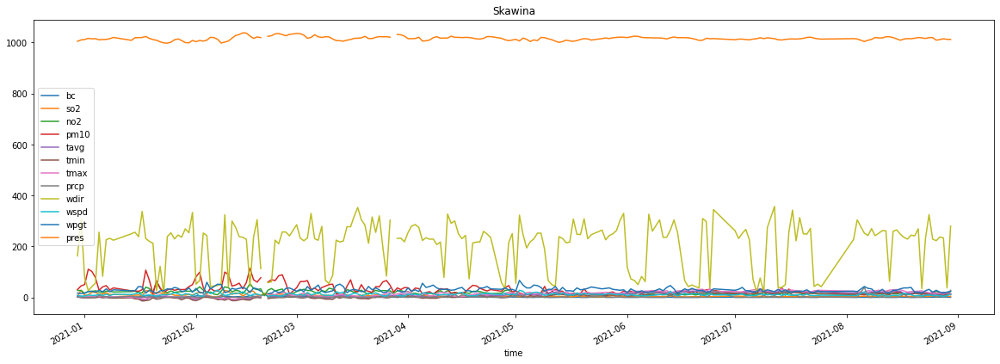

In [53]:
# plot the weather data and pollutant data of Skawina
Skawina_Data3 = Skawina_Data3.set_index("time")
Skawina_Data3.plot(y=list(Skawina_Data3.columns),figsize=(20,7),title="Skawina")

### Correlation analysis

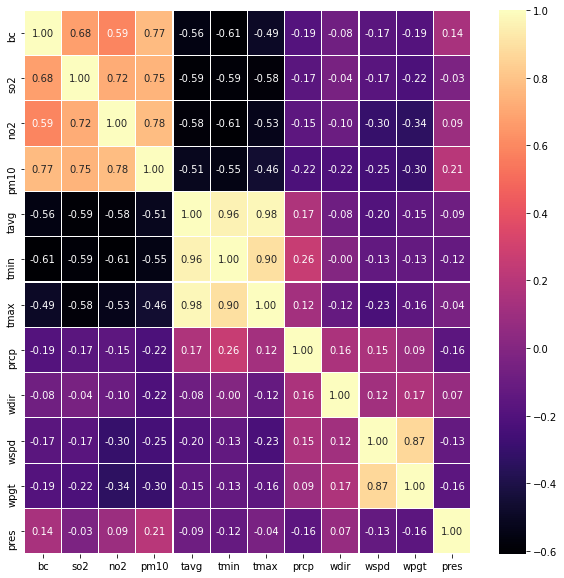

In [54]:
# Correlation analysis of weather and pollutants in Skawina
fig,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Skawina_Data3.corr(), ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="magma")
plt.show()

### Regression

In [55]:
# select the parameter of pm10 to fit a regression model
formula = 'pm10~ tavg + prcp + wdir + wspd + wpgt +pres' 
model = smf.ols(formula, Skawina_Data3).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   pm10   R-squared:                       0.471
Model:                            OLS   Adj. R-squared:                  0.456
Method:                 Least Squares   F-statistic:                     31.03
Date:                Mon, 06 Dec 2021   Prob (F-statistic):           1.56e-26
Time:                        20:22:10   Log-Likelihood:                -894.63
No. Observations:                 216   AIC:                             1803.
Df Residuals:                     209   BIC:                             1827.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -259.7626    149.990     -1.732      0.0

`R-squared`： 

In this model, the value of R square is 0.471，which means the model does not fit the data very poorly. 


`F-statistic`：

In this model, the p-value associated with the F-statistic is 1.56e-26, which is very small. 


`T-test`：

In this model, The p-values corresponds to t for some predictor variables(Intercept, pres) are very large, which indicates that these predictor variables are not significant and we may drop them in our future model.

`Fitted modle`：
pm10= -259.7626--1.3260*tavg-0.1190*prcp-0.0485*wdir-0.6143*wspd-0.4817*wpgt+0.3294*pres 

## Impact of USA Covid limiting measures on air quality

In order to more clearly observe and analyze THE NO2 content, we extracted the NO2 content of each city in the United States in the first week of 2020.

In [56]:
US_no2 = api.measurements(country = 'US',parameter = 'no2',date_from='2019-12-31',date_to='2020-01-06',limit=100000,df = True)

In [57]:
US_no2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 34521 entries, 2020-01-05 16:00:00 to 2019-12-30 18:00:00
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype              
---  ------                 --------------  -----              
 0   location               34521 non-null  object             
 1   parameter              34521 non-null  object             
 2   value                  34521 non-null  float64            
 3   unit                   34521 non-null  object             
 4   country                34521 non-null  object             
 5   city                   34521 non-null  object             
 6   date.utc               34521 non-null  datetime64[ns, UTC]
 7   coordinates.latitude   34521 non-null  float64            
 8   coordinates.longitude  34521 non-null  float64            
dtypes: datetime64[ns, UTC](1), float64(3), object(5)
memory usage: 2.6+ MB


In [58]:
#Find the mean in terms of city and paramer  
US_no2 = US_no2.groupby(['city', 'parameter'],as_index=False).mean().sort_values(by='value',ascending=False) 

We selected the eight U.S. cities with the highest LEVELS of NO2 in the first week of 2020. Below is a bar chart of NO2 content in these eight cities

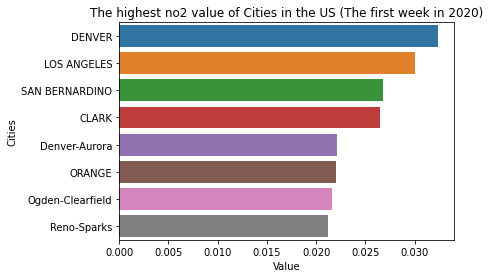

<Figure size 432x288 with 0 Axes>

In [59]:
#Parameter is extracted as no2 data  
US_no2 = US_no2.loc[US_no2['parameter'].isin(['no2'])].sort_values(by='value',ascending=False) 
#Plotting the graphs using the seaborn barplot (no2)
sns.barplot(x = US_no2['value'].head(8), y = US_no2['city'].head(8), data=US_no2)
#lable x axis as 'value'
plt.xlabel('Value')
#lable y axis as 'cities'
plt.ylabel('Cities')
plt.title('The highest no2 value of Cities in the US (The first week in 2020)')
#determine the size of this figure.
plt.figure(figsize=(6,4))
plt.show()

The main components of automobile exhaust include nitrogen oxides.  A reduction in the number of vehicles used during the COVID-19 lockdown may lead to a reduction in the variation of the pollutant NO2.  We analyzed and visualized data from the eight cities in the figure above (DENVER, LOS ANGELES, SAN BERNARDINO, CLARK, Denver-Aurora, ORANGE, Ogden-Clearfield, Reno-Sparks) to study the impact of COVID-19 on air quality in the United States.  

In [60]:
#Pull out the data for these eight cities
TOP_8 = api.measurements(city = ['DENVER','LOS ANGELES','SAN BERNARDINO','CLARK','Denver-Aurora','ORANGE','Ogden-Clearfield','Reno-Sparks'],parameter = 'no2',date_from='2020-01-01',date_to='2021-01-01',limit = 100000,df = True)

Make sure that the data is exactly from year 2020 and observe other information.

In [61]:
TOP_8.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 96397 entries, 2020-12-31 16:00:00 to 2019-12-31 16:00:00
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype              
---  ------                 --------------  -----              
 0   location               96397 non-null  object             
 1   parameter              96397 non-null  object             
 2   value                  96397 non-null  float64            
 3   unit                   96397 non-null  object             
 4   country                96397 non-null  object             
 5   city                   96397 non-null  object             
 6   date.utc               96397 non-null  datetime64[ns, UTC]
 7   coordinates.latitude   96397 non-null  float64            
 8   coordinates.longitude  96397 non-null  float64            
dtypes: datetime64[ns, UTC](1), float64(3), object(5)
memory usage: 7.4+ MB


In [62]:
TOP_8.tail(2)

,location,parameter,value,unit,country,city,date.utc,coordinates.latitude,coordinates.longitude
date.local,,,,,,,,,
2019-12-31 17:00:00,I25 Denver,no2,0.049,ppm,US,Denver-Aurora,2020-01-01 00:00:00+00:00,39.732144,-105.015313
2019-12-31 16:00:00,RT,no2,0.011,ppm,US,CLARK,2020-01-01 00:00:00+00:00,36.139707,-115.175654


In [63]:
TOP_8.head(2)

,location,parameter,value,unit,country,city,date.utc,coordinates.latitude,coordinates.longitude
date.local,,,,,,,,,
2020-12-31 16:00:00,Reno4,no2,0.007,ppm,US,Reno-Sparks,2021-01-01 00:00:00+00:00,39.521918,-119.795444
2020-12-31 16:00:00,Anaheim Near Road,no2,0.027,ppm,US,ORANGE,2021-01-01 00:00:00+00:00,33.819305,-117.918759


In [64]:
#print out the number of columns adn rows in this data
print('The dataset has ', TOP_8.shape[1], 'columns and ', TOP_8.shape[0], 'rows.')

The dataset has  9 columns and  96397 rows.


Observe the index of this dataframe

In [65]:
TOP_8.index

DatetimeIndex(['2020-12-31 16:00:00', '2020-12-31 16:00:00',
               '2020-12-31 17:00:00', '2020-12-31 16:00:00',
               '2020-12-31 16:00:00', '2020-12-31 16:00:00',
               '2020-12-31 17:00:00', '2020-12-31 16:00:00',
               '2020-12-31 16:00:00', '2020-12-31 17:00:00',
               ...
               '2019-12-31 16:00:00', '2019-12-31 16:00:00',
               '2019-12-31 17:00:00', '2019-12-31 16:00:00',
               '2019-12-31 16:00:00', '2019-12-31 17:00:00',
               '2019-12-31 17:00:00', '2019-12-31 16:00:00',
               '2019-12-31 17:00:00', '2019-12-31 16:00:00'],
              dtype='datetime64[ns]', name='date.local', length=96397, freq=None)

Splitting the date and time into two separate columns

In [66]:
#add a new column same a the index column in this dataframe 
TOP_8['date and time'] = TOP_8.index
#separate 'date' and 'time' in the 'date and time' column
TOP_8['time'],TOP_8['date']= TOP_8['date and time'].apply(lambda x:x.time()), TOP_8['date and time'].apply(lambda x:x.date())
#drop the 'date adn time' column in the dataframe
TOP_8 = TOP_8.drop(['date and time'],axis=1)
TOP_8.head()

,location,parameter,value,unit,country,city,date.utc,coordinates.latitude,coordinates.longitude,time,date
date.local,,,,,,,,,,,
2020-12-31 16:00:00,Reno4,no2,0.007,ppm,US,Reno-Sparks,2021-01-01 00:00:00+00:00,39.521918,-119.795444,16:00:00,2020-12-31
2020-12-31 16:00:00,Anaheim Near Road,no2,0.027,ppm,US,ORANGE,2021-01-01 00:00:00+00:00,33.819305,-117.918759,16:00:00,2020-12-31
2020-12-31 17:00:00,Denver - CAMP - 2105,no2,0.045,ppm,US,Denver-Aurora,2021-01-01 00:00:00+00:00,39.751099,-104.987198,17:00:00,2020-12-31
2020-12-31 16:00:00,60 Near Road,no2,0.017,ppm,US,SAN BERNARDINO,2021-01-01 00:00:00+00:00,34.030900,-117.617403,16:00:00,2020-12-31
2020-12-31 16:00:00,Pico Rivera,no2,0.012,ppm,US,LOS ANGELES,2021-01-01 00:00:00+00:00,34.010283,-118.068484,16:00:00,2020-12-31


In order to analyse data by month, we need to create a new column.(The month part in 'date' column)

In [67]:
#add a new column which is the month of this date in the same row
TOP_8['month'] = pd.DatetimeIndex(TOP_8['date']).month

In [68]:
TOP_8.head()

,location,parameter,value,unit,country,city,date.utc,coordinates.latitude,coordinates.longitude,time,date,month
date.local,,,,,,,,,,,,
2020-12-31 16:00:00,Reno4,no2,0.007,ppm,US,Reno-Sparks,2021-01-01 00:00:00+00:00,39.521918,-119.795444,16:00:00,2020-12-31,12
2020-12-31 16:00:00,Anaheim Near Road,no2,0.027,ppm,US,ORANGE,2021-01-01 00:00:00+00:00,33.819305,-117.918759,16:00:00,2020-12-31,12
2020-12-31 17:00:00,Denver - CAMP - 2105,no2,0.045,ppm,US,Denver-Aurora,2021-01-01 00:00:00+00:00,39.751099,-104.987198,17:00:00,2020-12-31,12
2020-12-31 16:00:00,60 Near Road,no2,0.017,ppm,US,SAN BERNARDINO,2021-01-01 00:00:00+00:00,34.030900,-117.617403,16:00:00,2020-12-31,12
2020-12-31 16:00:00,Pico Rivera,no2,0.012,ppm,US,LOS ANGELES,2021-01-01 00:00:00+00:00,34.010283,-118.068484,16:00:00,2020-12-31,12


Monthly variation of NO2 content

In [69]:
#Extract five columns that are useful for our data analysis
TOP_8_month = TOP_8.loc[:, ["value", "time","month","city","date"]]
#Calculate mean value according to city and month
TOP_8_month = TOP_8_month.groupby(["month","city"]).mean()
TOP_8_month.head()

value
month city                   
1     CLARK          0.028849
      DENVER         0.034499
      Denver-Aurora  0.025475
      LOS ANGELES    0.028286
      ORANGE         0.024614

Weekly variation of NO2 content

In [70]:
#create a new column 'week'. It's length is the same as the number of rows in this dataframe.
TOP_8["week"] = TOP_8["date"]
#a for loop to find out what week this date is in 2020
for i in range(len(TOP_8["date"])):
    TOP_8["week"][i] = TOP_8["date"][i].strftime("%V")
#Calculate mean value according to city and week
TOP_8_week = TOP_8.groupby(["city","week"]).mean()

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Draw two figures separately to see the monthly and weekly variation of NO2 content during 2020. The darker and larger the dots, the higher the no2 content and the higher the air pollution.


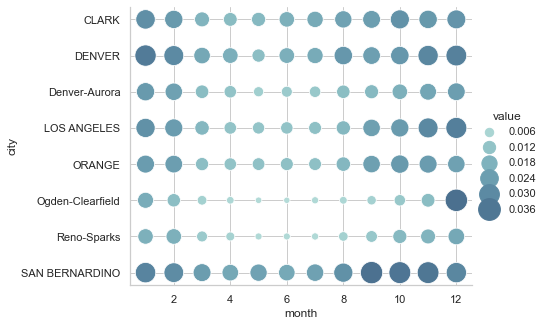

In [71]:
#Select a beautiful theme 
sns.set_theme(style="whitegrid")
#Select the gradient color as blue
cmap_blue = sns.cubehelix_palette(rot=-0.25, as_cmap=True)
#draw this plot to observe no2 content in each city
g = sns.relplot(
    data=TOP_8_month,
    x="month", y="city",
    hue='value',size='value',
    hue_norm=(0.0,0.06),
    sizes=(40, 500),
    height = 4.5,
    aspect=1.5,
    palette=cmap_blue)

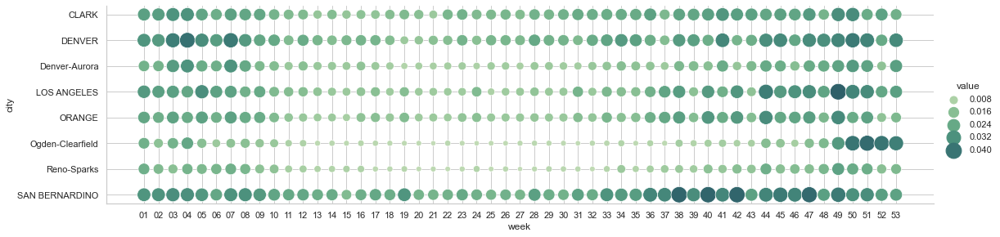

In [72]:
#Select the gradient color as green
cmap_green = sns.cubehelix_palette(rot=-0.5, as_cmap=True)

g_week = sns.relplot(
    data=TOP_8_week,
    x="week", y="city",
    hue='value',size='value',
    hue_norm=(0.0,0.06),
    sizes=(40, 400),
    height = 4,
    aspect= 4,
    palette=cmap_green)

After observing two figures, we can find after February(week 4), there was a significant decrease in nitrogen dioxide levels(except SAN BERNARDINO). Then after May(week 20), the levels began to rise gradually. 
Let's look at the timeline of Covid 19 issues that affect the United States.

January 21 — CDC Confirms First US Coronavirus Case

January 21 — Chinese Scientist Confirms COVID-19 Human Transmission

February 2 — Global Air Travel Is Restricted

February 3 — US Declares Public Health Emergency

February 25 — CDC Says COVID-19 Is Heading Toward Pandemic Status

March 13 — Trump Declares COVID-19 a National Emergency

March 17 — CMS Temporarily Expands Use of Telehealth

March 17 — Administration Asks Congress to Send Americans Direct Financial Relief

March 19 — States issue Statewide Stay-at-Home Order(important)

March 25 — Reports Find Extended Shutdowns Can Delay Second Wave

April 16 — “Gating Criteria” Emerge as a Way to Reopen the Economy(important)

         (After Trump briefly entertains the idea of reopening the US economy in time for Easter Sunday, the White House releases broad guidelines for how people could return to work, to church, and to restaurants and other venues.) 
         
May 21 — United States and AstraZeneca Form Vaccine Deal

May 22 — Fauci says staying closed for too long could cause 'irreparable damage'.(He completely changed his previous statement)

In January, the Novel Coronavirus came to the attention of the American public. And in March, several States issue the Stay at Home Order.  As people travel less due to COVID-19, the emission of NO2 has decreased, reducing the level of air pollution. From mid-April, the government began to consider reopening policies and issued guidelines to allow people to gradually return to their original levels of travel.  

The no2 levels in SAN Bernardino(the last city in this figure), which declined slightly from March to May, were not as steep as those in other cities.However, California is one of the earliest states to enact stay-at-home order, which indicates that there are other factors affecting NO2 content.

This may be because SAN Bernardino is the poorest city in California and even faced serious financial problems of bankruptcy in 2016. The situation has improved in recent years, but affordability issues have prevented environmental governance from keeping pace with other cities. For example, the number of private cars in SAN Bernardino is lower than that of other cities, and the NO2 emission from large factories such as power plants is higher than that of other cities. Therefore, the change of NO2 emission from vehicles due to COVID-19 cannot be significantly shown in the figure.

-----------------------------------------------------------------------------------------------------------------------------------

-----------------------------------------------------------------------------------------------------------------------------------

Another simpler approach.

We can also visualize the data by line graph:

Extract four useful columns.

In [73]:
TOP_8 = TOP_8.loc[:, ["value", "time","date","city"]]
TOP_8.head(3)

,value,time,date,city
date.local,,,,
2020-12-31 16:00:00,0.007,16:00:00,2020-12-31,Reno-Sparks
2020-12-31 16:00:00,0.027,16:00:00,2020-12-31,ORANGE
2020-12-31 17:00:00,0.045,17:00:00,2020-12-31,Denver-Aurora


Find the mean value for each city and date.

In [74]:
TOP_8 = TOP_8.groupby(["date","city"]).mean()
TOP_8.head(6)

value
date       city                      
2019-12-31 CLARK             0.027875
           DENVER            0.054800
           Denver-Aurora     0.045333
           LOS ANGELES       0.032312
           ORANGE            0.025375
           Ogden-Clearfield  0.024429

Change the format of the data to something like a table.

In [75]:
stacked = TOP_8.stack()
ok = stacked.unstack(1)
ok.head()

,city,CLARK,DENVER,Denver-Aurora,LOS ANGELES,ORANGE,Ogden-Clearfield,Reno-Sparks,SAN BERNARDINO
date,,,,,,,,,
2019-12-31,value,0.027875,0.054800,0.045333,0.032312,0.025375,0.024429,0.029000,0.024375
2020-01-01,value,0.027125,0.030409,0.022402,0.018957,0.015783,0.012625,0.015667,0.021217
2020-01-02,value,0.020417,0.034053,0.020866,0.028187,0.022667,0.018375,0.025913,0.030812
2020-01-03,value,0.034708,0.035045,0.021193,0.036542,0.030125,0.021750,0.032000,0.040417
2020-01-04,value,0.027667,0.029318,0.019705,0.034042,0.030458,0.030000,0.014813,0.033375


Get line plots of the change of NO2 in the eight cities.

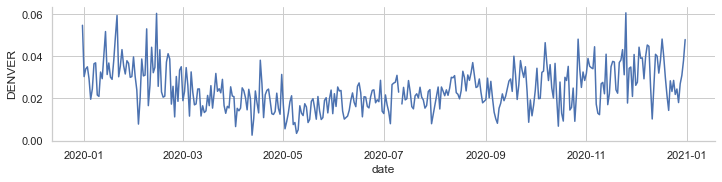

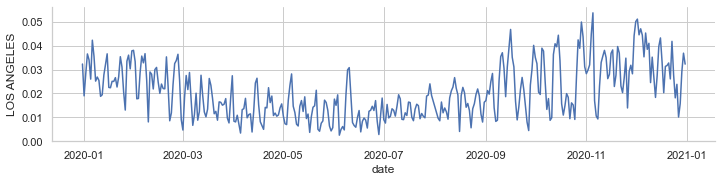

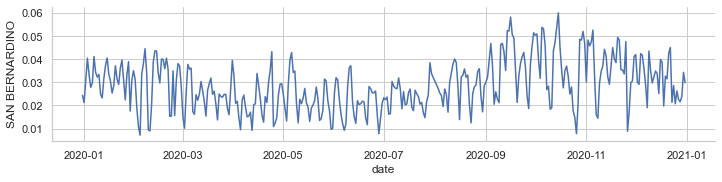

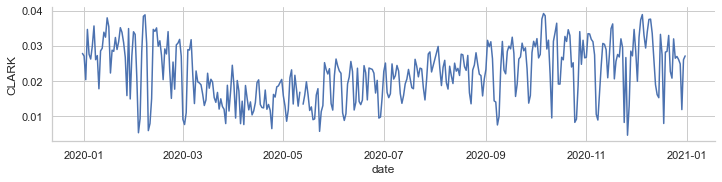

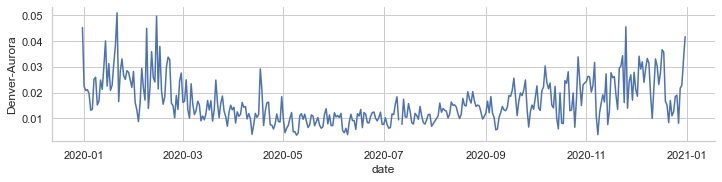

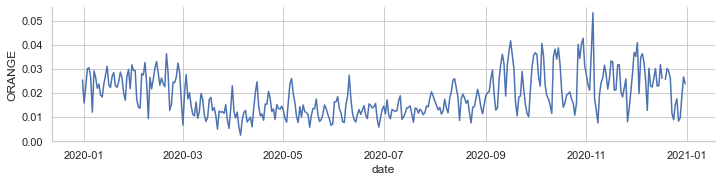

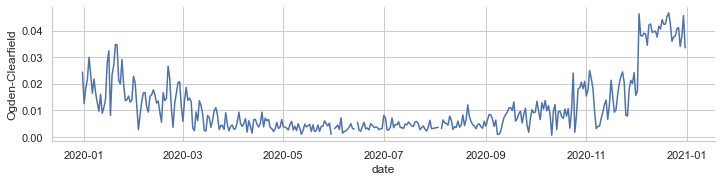

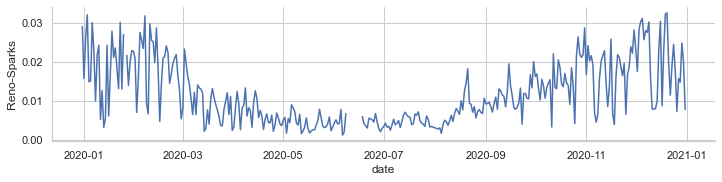

In [76]:
sns.relplot(data = ok,x = "date",y='DENVER',kind = "line",aspect= 4, height =2.5)
sns.relplot(data = ok,x = "date",y='LOS ANGELES',kind = "line",aspect= 4, height =2.5)
sns.relplot(data = ok,x = "date",y='SAN BERNARDINO',kind = "line",aspect= 4, height =2.5)
sns.relplot(data = ok,x = "date",y='CLARK',kind = "line",aspect= 4, height =2.5)
sns.relplot(data = ok,x = "date",y='Denver-Aurora',kind = "line",aspect= 4, height =2.5)
sns.relplot(data = ok,x = "date",y='ORANGE',kind = "line",aspect= 4, height =2.5)
sns.relplot(data = ok,x = "date",y='Ogden-Clearfield',kind = "line",aspect= 4, height =2.5)
sns.relplot(data = ok,x = "date",y='Reno-Sparks',kind = "line",aspect= 4, height =2.5)

Put eight line plots into one figure.

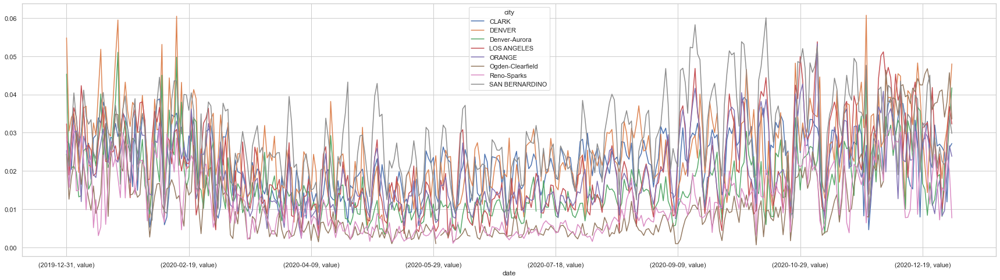

In [77]:
ok.plot(figsize=(30,8),xlabel = 'date')